## import

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os
sys.path.append(f'{os.getcwd()}/irc_gym')

In [3]:
import os
import sys
sys.path.append(f'{os.getcwd()}/irc_gym')
from auditoryforage.AF_env import AuditoryForagingReward2 as AFR2
from stable_baselines3 import PPO
from irc_gym.irc.model import FuncBeliefModel
from multiprocessing import Pool
import multiprocessing as mp
import multiprocessing
from ult import *

In [4]:
import wandb
from wandb.integration.sb3 import WandbCallback


# settings

In [5]:
# template for training
print('''
    date 5.4
    goal:
      nice periodic,
    new: 
      log scale food reward list
      67 instead of 56.
    comments:
      not great, attention too little and lick too much, since no punishment
''')
# training hyper params
epoch_size = 11111
eval_size = 999
n_epoch = 77
n_seed=1

# reward list
vmin, vmax=np.log(10),np.log(10000)
food_reward_list = np.linspace(vmin, vmax, 11)
food_reward_list=np.exp(food_reward_list)
print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [0, 1500, 0.087213, .25, -30, 0, 0]
#
modelname='date_4_67_log'


    date 5.4
    goal:
      nice periodic,
    new: 
      log scale food reward list
      67 instead of 56.
    comments:
      not great, attention too little and lick too much, since no punishment

food reard list:  ['10', '20', '40', '79', '158', '316', '631', '1259', '2512', '5012', '10000']


In [6]:
# template for training
print('''
    date 5.5
    goal:
      nice periodic,
    new: 
      log scale food reward list
      56. 
    comments:
      try 56 first.
      log scale is not working well. agent not doing anything. maybe too many small rewards.
''')
# training hyper params
epoch_size = 11111
eval_size = 999
n_epoch = 66
n_seed=1

# reward list
vmin, vmax=np.log(10),np.log(10000)
food_reward_list = np.linspace(vmin, vmax, 11)
food_reward_list=np.exp(food_reward_list)
print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [0, 1500, 0.087213, .25, -30, 0, 0]
#
modelname='date_5_56'


    date 5.5
    goal:
      nice periodic,
    new: 
      log scale food reward list
      56. 
    comments:
      try 56 first.
      log scale is not working well. agent not doing anything. maybe too many small rewards.

food reard list:  ['10', '20', '40', '79', '158', '316', '631', '1259', '2512', '5012', '10000']


In [7]:
# template for training
print('''
    date 5.5
    goal:
      nice periodic,
    new: 
        smaller range log, 56
    comments:
''')
# training hyper params
epoch_size = 15000
eval_size = 700
n_epoch = 40
n_seed=1

# reward list
vmin, vmax=np.log(50),np.log(6000)
food_reward_list = np.linspace(vmin, vmax, 9)
food_reward_list=np.exp(food_reward_list)
print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [0, 1500, 0.087213, .25, -30, 0, 0]
#
modelname='date_5_56_small'


    date 5.5
    goal:
      nice periodic,
    new: 
        smaller range log, 56
    comments:

food reard list:  ['50', '91', '165', '301', '548', '996', '1813', '3298', '6000']


In [8]:
# template for training
print('''
    date 5.5
    goal:
      nice periodic,
    new: 
        linear 56
    comments:
''')
# training hyper params
epoch_size = 15000
eval_size = 700
n_epoch = 50
n_seed=1

# reward list
vmin, vmax=np.log(10),np.log(6000)
food_reward_list = np.linspace(vmin, vmax, 9)
food_reward_list=np.exp(food_reward_list)
print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-10, 1500, 0.087213, .45, -30, 0, 0]
#
modelname='date_5_56_log'


    date 5.5
    goal:
      nice periodic,
    new: 
        linear 56
    comments:

food reard list:  ['10', '22', '49', '110', '245', '545', '1212', '2697', '6000']


In [9]:
# template for training
print('''
    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
    comments:
      10 - 3000 shows a nice change
''')
# training hyper params
epoch_size = 15000
eval_size = 700
n_epoch = 60
n_seed=1

# reward list
vmin, vmax=(10),(6000)
food_reward_list = np.linspace(vmin, vmax, 9)
# food_reward_list=np.exp(food_reward_list)
print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-10, 1500, 0.087213, .45, -30, 0, 0]
#
modelname='date_6_56_linear'


    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
    comments:
      10 - 3000 shows a nice change

food reard list:  ['10', '759', '1508', '2256', '3005', '3754', '4502', '5251', '6000']


In [10]:
# template for training
print('''
    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
        use the env param that generate good peroid the first time
    comments:

''')
# training hyper params
epoch_size = 15000
eval_size = 700
n_epoch = 80
n_seed=1
p1p2=np.array([0.5,0.6])
p1p2=None

# reward list
vmin, vmax=10,10000
food_reward_list = np.linspace(vmin, vmax, 5)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-10, 1500, 0.087213, .25, -50, -10, 0]
#
modelname='date_6_56_linear_2'


    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
        use the env param that generate good peroid the first time
    comments:


food reard list:  ['10', '2508', '5005', '7502', '10000']


In [11]:
# template for training
print('''
    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
        use the env param that generate good peroid the first time
    comments:
    some nice gradient plots. some opposite result for the attn vs sig prob plot. coudl because the cost of attn > lick?
''')
# training hyper params
epoch_size = 15000
eval_size = 700
n_epoch = 80
n_seed=1
p1p2=np.array([0.5,0.6])
p1p2=None

# reward list
vmin, vmax=100,10000
food_reward_list = np.linspace(vmin, vmax, 5)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-10, 1500, 0.087213, .1, -50, 0, 0]
#
modelname='date_6_56_linear_small'


    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
        use the env param that generate good peroid the first time
    comments:
    some nice gradient plots. some opposite result for the attn vs sig prob plot. coudl because the cost of attn > lick?

food reard list:  ['100', '2575', '5050', '7525', '10000']


In [12]:
# template for training
print('''
    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
        use the env param that generate good peroid the first time
    comments:
    some nice gradient plots. some opposite result for the attn vs sig prob plot. coudl because the cost of attn > lick?
''')
# training hyper params
epoch_size = 15000
eval_size = 700
n_epoch = 80
n_seed=1
p1p2=np.array([.6,.7])
p1p2=None

# reward list
vmin, vmax=100,10000
food_reward_list = np.linspace(vmin, vmax, 5)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-10, 1500, 0.087213, .1, -50, 0, 0]
#
modelname='date_6_67_linear_small'


    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
        use the env param that generate good peroid the first time
    comments:
    some nice gradient plots. some opposite result for the attn vs sig prob plot. coudl because the cost of attn > lick?

food reard list:  ['100', '2575', '5050', '7525', '10000']


# current settings

In [13]:
# template for training
print('''
    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
        use the env param that generate good peroid the first time
    comments:
    some nice gradient plots. some opposite result for the attn vs sig prob plot. coudl because the cost of attn > lick?
''')
# training hyper params
epoch_size = 15000
eval_size = 700
n_epoch = 80
n_seed=1
p1p2=np.array([.5,.7])
p1p2=None

# reward list
vmin, vmax=10,10000
food_reward_list = np.linspace(vmin, vmax, 10)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-10, 1500, 0.087213, .25, -50, 0, 0]
#
modelname='date_7_largerange'


    date 5.6
    goal:
      nice periodic,
    new: 
        linear 56
        use the env param that generate good peroid the first time
    comments:
    some nice gradient plots. some opposite result for the attn vs sig prob plot. coudl because the cost of attn > lick?

food reard list:  ['10', '1120', '2230', '3340', '4450', '5560', '6670', '7780', '8890', '10000']


## train

In [14]:
# play with attn cost
# task = AFR2(spec={'agent': {'lick_cost': env_param[0],
#                             'food_reward': env_param[1],
#                             'attention_cost_coeff':.01,
#                             'attention_cost_temp': 0.25, # attn cost, related to unceratinty.
#                             'penalty_cost': env_param[4], # fa
#                             'iti_cost': env_param[5],
#                                 'time_in_game_reward': env_param[6]}})
# task.food_reward_list = food_reward_list

# taskbelief = FuncBeliefModel(env=task, rng=1)
# run_one_episode(task, taskbelief, model)
# task.attention_cost, task.penalty_cost, task.iti_cost, task.time_in_game_reward

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yizhouc. Use `wandb login --relogin` to force relogin


/home/yc/miniconda3/envs/ffneural/lib/python3.12/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


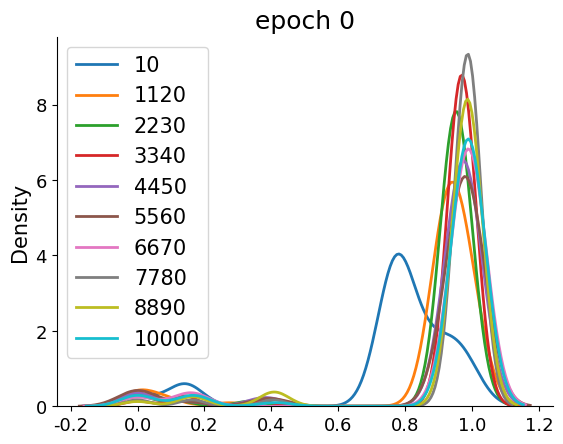

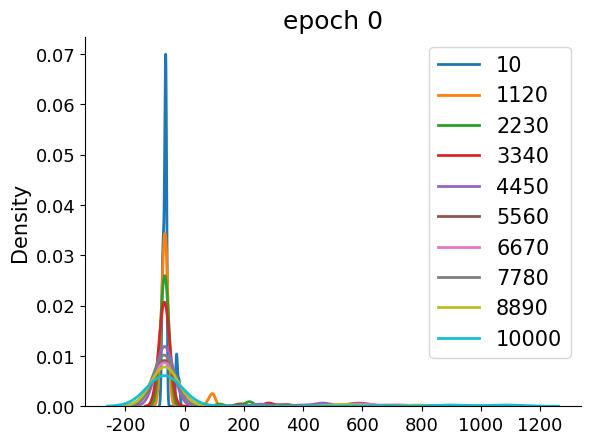

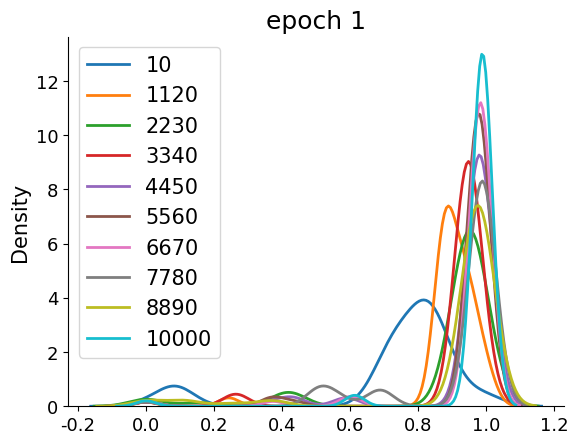

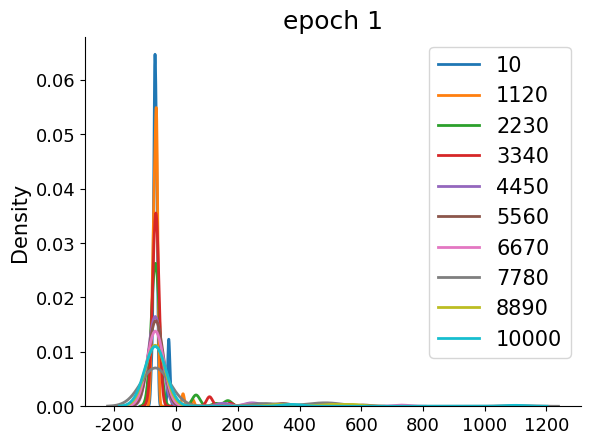

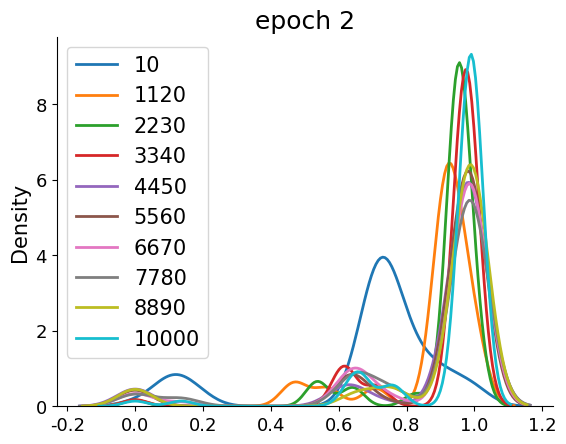

...

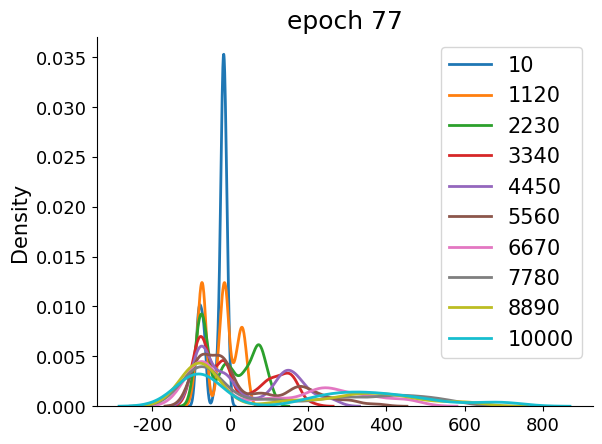

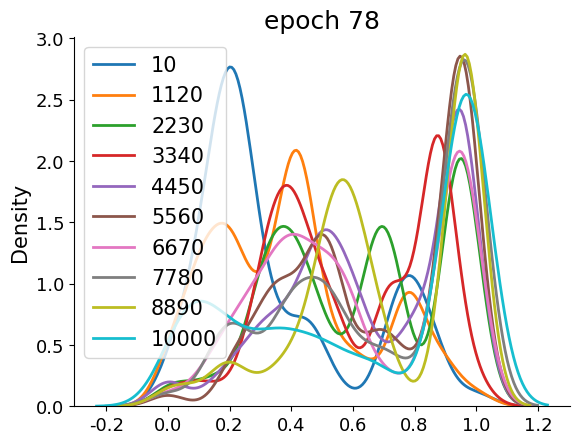

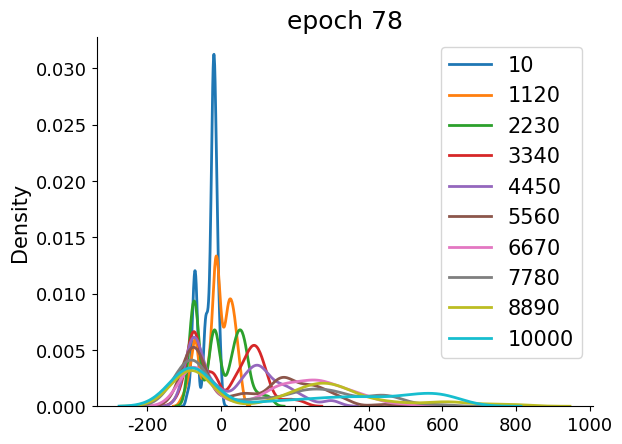

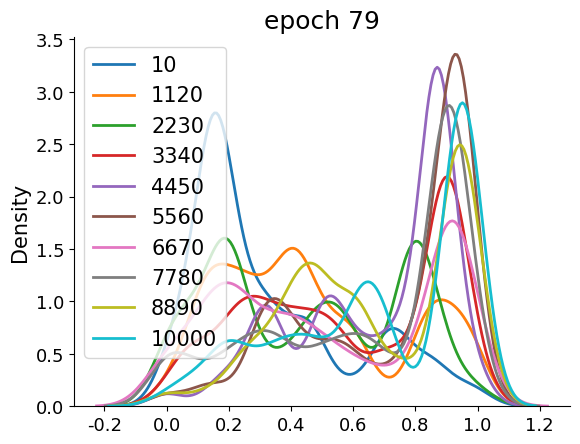

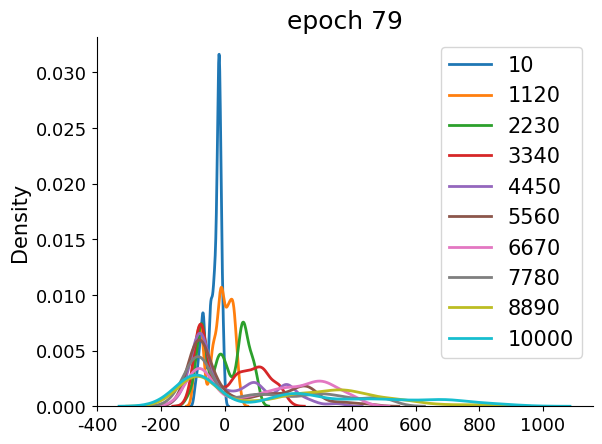

global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
rollout/ep_len_mean,▁▃▄▆▆▇▆▇▇▇▇█▇▇▇▇██▇▇▆▇▇▇▇▇█▇▇▇▆▇▆▇▇▇▇█▇▇
rollout/ep_rew_mean,▃▁▁▂▃▁▅▃▂▂▄▂▃▃▂▄▃▃▅▃█▅▃▄▄▄▅▂▂▅▂▂▄▅▄▂▃▅▅▅
time/fps,█▇▇▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
train/approx_kl,█▄▇█▅▂▂▅▂▅▃▅▂▂▂▄▄▅▅▂▂▂▅▃▁▄▄▅▆▆▄▅▁▃▄▄▄▃▆▄
train/clip_fraction,█▃▂▃▅▂▃▁▁▃▁▄▁▁▁▃▂▄▃▁▂▁▄▃▁▃▂▂▃▃▆▅▁▁▂▂▃▂▁▃
train/clip_range,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/entropy_loss,▁▃▄▅▇▇▇▇▆▆▇▇▇▇▇▇▇▇████▇▇▇██▇▇▇▇█▇█▇███▇█
train/explained_variance,▁▂▂▃▃▅▅▆▅▆▂▃▇▅▅▅▆▄▆▇▄▅▆▃▄▄▇▄▃▄▅▃▄▆▃▄▃█▅▇
train/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▅▂▂▂▂▂▂▂▁▂▂▁▁▂▂▁▁▁▁▂▂▁▁▁▂▁▂▂▂▁▂▂▁▂▁▂▂▂▂


In [15]:
for seed in range(n_seed):

    # set seed
    np.random.seed(seed)

    task = AFR2(spec={'agent': {'lick_cost': env_param[0],
                                'food_reward': env_param[1],
                                'attention_cost_coeff': env_param[2],
                                'attention_cost_temp': env_param[3],
                                'penalty_cost': env_param[4],
                                'iti_cost': env_param[5],
                                'time_in_game_reward': env_param[6]}})

    task.food_reward_list = food_reward_list
    taskbelief = FuncBeliefModel(env=task, rng=1)

    # set p1 p2
    if p1p2:
        task.obs_certainity_possible=p1p2
    
    # init wandb log
    run = wandb.init(
        project="lokesh_rl",
        save_code=True,  # optional
        sync_tensorboard=True,  # auto-upload sb3's tensorboard metrics
    )

    model = PPO('MlpPolicy', taskbelief, verbose=0, device='cpu',
                clip_range=0.1, ent_coef=0.01, tensorboard_log=f"runs",)

    # train
    for i in range(n_epoch):
        model.learn(total_timesteps=epoch_size,
                    tb_log_name=f'seed_{seed}',
                    reset_num_timesteps=False,
                    callback=WandbCallback(
                        gradient_save_freq=100,
                        verbose=2,
                        model_save_path=f"models/{run.id}",
                    ),)
        model.save(f'ycstore/seed_{seed}_{modelname}')

        # run mp job for eval
        def eval_agent(a):
            t = 0
            total_r = 0  # trial total reward
            x = taskbelief.reset()
            done = False
            while not done:
                # model.predict(x)
                a, _ = model.predict(x, deterministic=False)
                x, r, done, _ = taskbelief.step(a)
                # print(x, r,task.food_reward)
                t += 1
                total_r += r  # updating trial total reward
            return taskbelief.env.food_reward, total_r

        with multiprocessing.Pool(processes=27) as pool:
            results = pool.map(eval_agent, range(eval_size))

        # process mp res
        history_r = defaultdict(list)
        for food_reward, total_r in results:
            history_r[food_reward].append(total_r)

        # plot, normalized
        for k in sorted(history_r.keys()):
            v = history_r[k]
            v = (v - min(v)) / (max(v) - min(v))
            v = 1-v
            sns.kdeplot(v, fill=False, label=f'{k:.0f}', bw_adjust=0.5,common_norm=False)
        plt.legend()
        plt.title(f'epoch {i}')
        plt.show()

        # plot, not normalized
        for k in sorted(history_r.keys()):
            v = history_r[k]
            sns.kdeplot(v, fill=False, label=f'{k:.0f}', bw_adjust=0.5,common_norm=False)
        plt.legend()
        plt.title(f'epoch {i}')
        plt.show()
    run.finish()
    notify(f'training {modelname} finished')

# overnight jobs

In [17]:
# template for training
print('''

''')
# training hyper params
epoch_size = 15000
eval_size = 700
n_epoch = 99
n_seed=1
p1p2=np.array([.6,.7])
p1p2=None

# reward list
vmin, vmax=10,5000
food_reward_list = np.linspace(vmin, vmax, 5)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-10, 1500, 0.087213, .1, -50, 0, 0]
modelname='date_7_67_lickcost'



for seed in range(n_seed):

    # set seed
    np.random.seed(seed)

    task = AFR2(spec={'agent': {'lick_cost': env_param[0],
                                'food_reward': env_param[1],
                                'attention_cost_coeff': env_param[2],
                                'attention_cost_temp': env_param[3],
                                'penalty_cost': env_param[4],
                                'iti_cost': env_param[5],
                                'time_in_game_reward': env_param[6]}})

    task.food_reward_list = food_reward_list
    taskbelief = FuncBeliefModel(env=task, rng=1)

    # set p1 p2
    if p1p2:
        task.obs_certainity_possible=p1p2
    
    model = PPO('MlpPolicy', taskbelief, verbose=0, device='cpu',
                clip_range=0.1, ent_coef=0.01, tensorboard_log=f"runs",)

    # train
    for i in range(n_epoch):
        model.learn(total_timesteps=epoch_size,
                    tb_log_name=f'seed_{seed}_{modelname}',
                    reset_num_timesteps=False,
                    )
        model.save(f'ycstore/seed_{seed}_{modelname}')

    notify(f'training {modelname} finished')

/home/yc/miniconda3/envs/ffneural/lib/python3.12/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`





food reard list:  ['10', '1258', '2505', '3752', '5000']


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, pleas

In [18]:
# template for training
print('''

''')
# training hyper paramsa
epoch_size = 15000
eval_size = 700
n_epoch = 99
n_seed=1
p1p2=np.array([.5,.6])
p1p2=None

# reward list
vmin, vmax=10,5000
food_reward_list = np.linspace(vmin, vmax, 9)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-10, 1500, 0.087213, .1, -50, 0, 0]
modelname='date_7_56_lickcost'



for seed in range(n_seed):

    # set seed
    np.random.seed(seed)

    task = AFR2(spec={'agent': {'lick_cost': env_param[0],
                                'food_reward': env_param[1],
                                'attention_cost_coeff': env_param[2],
                                'attention_cost_temp': env_param[3],
                                'penalty_cost': env_param[4],
                                'iti_cost': env_param[5],
                                'time_in_game_reward': env_param[6]}})

    task.food_reward_list = food_reward_list
    taskbelief = FuncBeliefModel(env=task, rng=1)

    # set p1 p2
    if p1p2:
        task.obs_certainity_possible=p1p2
    
    model = PPO('MlpPolicy', taskbelief, verbose=0, device='cpu',
                clip_range=0.1, ent_coef=0.01, tensorboard_log=f"runs",)

    # train
    for i in range(n_epoch):
        model.learn(total_timesteps=epoch_size,
                    tb_log_name=f'seed_{seed}_{modelname}',
                    reset_num_timesteps=False,
                    )
        model.save(f'ycstore/seed_{seed}_{modelname}')

    notify(f'training {modelname} finished')

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`





food reard list:  ['10', '634', '1258', '1881', '2505', '3129', '3752', '4376', '5000']


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, pleas

In [19]:
# template for training
print('''

''')
# training hyper paramsa
epoch_size = 15000
eval_size = 700
n_epoch = 99
n_seed=1
p1p2=np.array([.5,.6])
p1p2=None

# reward list
vmin, vmax=10,5000
food_reward_list = np.linspace(vmin, vmax, 9)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-0, 1500, 0.087213, .1, -50, 0, 0]
modelname='date7_56'



for seed in range(n_seed):

    # set seed
    np.random.seed(seed)

    task = AFR2(spec={'agent': {'lick_cost': env_param[0],
                                'food_reward': env_param[1],
                                'attention_cost_coeff': env_param[2],
                                'attention_cost_temp': env_param[3],
                                'penalty_cost': env_param[4],
                                'iti_cost': env_param[5],
                                'time_in_game_reward': env_param[6]}})

    task.food_reward_list = food_reward_list
    taskbelief = FuncBeliefModel(env=task, rng=1)

    # set p1 p2
    if p1p2:
        task.obs_certainity_possible=p1p2
    
    model = PPO('MlpPolicy', taskbelief, verbose=0, device='cpu',
                clip_range=0.1, ent_coef=0.01, tensorboard_log=f"runs",)

    # train
    for i in range(n_epoch):
        model.learn(total_timesteps=epoch_size,
                    tb_log_name=f'seed_{seed}_{modelname}',
                    reset_num_timesteps=False,
                    )
        model.save(f'ycstore/seed_{seed}_{modelname}')

    notify(f'training {modelname} finished')

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`





food reard list:  ['10', '634', '1258', '1881', '2505', '3129', '3752', '4376', '5000']


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, pleas

In [20]:
# template for training
print('''

''')
# training hyper paramsa
epoch_size = 15000
eval_size = 700
n_epoch = 99
n_seed=1
p1p2=np.array([.6,.7])
p1p2=None

# reward list
vmin, vmax=10,5000
food_reward_list = np.linspace(vmin, vmax, 9)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-0, 1500, 0.087213, .1, -50, 0, 0]
modelname='date7_67'




for seed in range(n_seed):

    # set seed
    np.random.seed(seed)

    task = AFR2(spec={'agent': {'lick_cost': env_param[0],
                                'food_reward': env_param[1],
                                'attention_cost_coeff': env_param[2],
                                'attention_cost_temp': env_param[3],
                                'penalty_cost': env_param[4],
                                'iti_cost': env_param[5],
                                'time_in_game_reward': env_param[6]}})

    task.food_reward_list = food_reward_list
    taskbelief = FuncBeliefModel(env=task, rng=1)

    # set p1 p2
    if p1p2:
        task.obs_certainity_possible=p1p2
    
    model = PPO('MlpPolicy', taskbelief, verbose=0, device='cpu',
                clip_range=0.1, ent_coef=0.01, tensorboard_log=f"runs",)

    # train
    for i in range(n_epoch):
        model.learn(total_timesteps=epoch_size,
                    tb_log_name=f'seed_{seed}_{modelname}',
                    reset_num_timesteps=False,
                    )
        model.save(f'ycstore/seed_{seed}_{modelname}')

    notify(f'training {modelname} finished')

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`





food reard list:  ['10', '634', '1258', '1881', '2505', '3129', '3752', '4376', '5000']


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, pleas

In [21]:
# template for training
print('''

''')
# training hyper paramsa
epoch_size = 15000
eval_size = 700
n_epoch = 99
n_seed=1
p1p2=np.array([.6,.7])
p1p2=None

# reward list
vmin, vmax=10,5000
food_reward_list = np.linspace(vmin, vmax, 9)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-0, 1500, 0.087213, .1, -30, 0, 0]
modelname='date7_67_orginalpenalty'




for seed in range(n_seed):

    # set seed
    np.random.seed(seed)

    task = AFR2(spec={'agent': {'lick_cost': env_param[0],
                                'food_reward': env_param[1],
                                'attention_cost_coeff': env_param[2],
                                'attention_cost_temp': env_param[3],
                                'penalty_cost': env_param[4],
                                'iti_cost': env_param[5],
                                'time_in_game_reward': env_param[6]}})

    task.food_reward_list = food_reward_list
    taskbelief = FuncBeliefModel(env=task, rng=1)

    # set p1 p2
    if p1p2:
        task.obs_certainity_possible=p1p2
    
    model = PPO('MlpPolicy', taskbelief, verbose=0, device='cpu',
                clip_range=0.1, ent_coef=0.01, tensorboard_log=f"runs",)

    # train
    for i in range(n_epoch):
        model.learn(total_timesteps=epoch_size,
                    tb_log_name=f'seed_{seed}_{modelname}',
                    reset_num_timesteps=False,
                    )
        model.save(f'ycstore/seed_{seed}_{modelname}')

    notify(f'training {modelname} finished')

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`





food reard list:  ['10', '634', '1258', '1881', '2505', '3129', '3752', '4376', '5000']


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, pleas

In [22]:
# template for training
print('''

''')
# training hyper paramsa
epoch_size = 15000
eval_size = 700
n_epoch = 99
n_seed=1
p1p2=np.array([.7,.8])
p1p2=None

# reward list
vmin, vmax=10,5000
food_reward_list = np.linspace(vmin, vmax, 9)
# food_reward_list=np.exp(food_reward_list)

print('food reard list: ', [f'{a:.0f}' for a in food_reward_list])

# other env params
env_param = [-0, 1500, 0.087213, .1, -30, 0, 0]
modelname='date7_67_orginalpenalty'

for seed in range(n_seed):

    # set seed
    np.random.seed(seed)

    task = AFR2(spec={'agent': {'lick_cost': env_param[0],
                                'food_reward': env_param[1],
                                'attention_cost_coeff': env_param[2],
                                'attention_cost_temp': env_param[3],
                                'penalty_cost': env_param[4],
                                'iti_cost': env_param[5],
                                'time_in_game_reward': env_param[6]}})

    task.food_reward_list = food_reward_list
    taskbelief = FuncBeliefModel(env=task, rng=1)

    # set p1 p2
    if p1p2:
        task.obs_certainity_possible=p1p2
    
    model = PPO('MlpPolicy', taskbelief, verbose=0, device='cpu',
                clip_range=0.1, ent_coef=0.01, tensorboard_log=f"runs",)

    # train
    for i in range(n_epoch):
        model.learn(total_timesteps=epoch_size,
                    tb_log_name=f'seed_{seed}_{modelname}',
                    reset_num_timesteps=False,
                    )
        model.save(f'ycstore/seed_{seed}_{modelname}')

    notify(f'training {modelname} finished')

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`





food reard list:  ['10', '634', '1258', '1881', '2505', '3129', '3752', '4376', '5000']


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
wandb: WARNING When using several event log directories, pleas